
# Loan status prediction

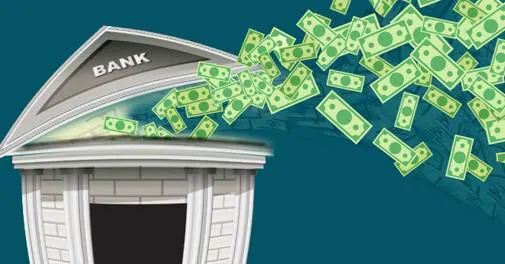 

# Changing directory

In [1]:
import os
os.chdir(r'C:\Users\hmdra\Desktop\Metro College_Teaching Materials\Business Analytics\My class\Codes')
os.getcwd()

'C:\\Users\\hmdra\\Desktop\\Metro College_Teaching Materials\\Business Analytics\\My class\\Codes'

# Importing librarires

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Importing the numpy and pandas package
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O 

!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
import pandas_profiling

# Data Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Created wheel for pandas-profiling: filename=pandas_profiling-2.9.0-py2.py3-none-any.whl size=258957 sha256=46750a08076dc1a6ae010328c5a94b603fddda6c186c14e656369095d58f31df
  Stored in directory: C:\Users\Public\Documents\Wondershare\CreatorTemp\pip-ephem-wheel-cache-9p7kblyh\wheels\56\c2\dd\8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
Successfully built pandas-profiling


# Importing Data with CSV format

https://www.kaggle.com/zaurbegiev/my-dataset

In [4]:
# loading csv data to dataframe 
train= pd.read_csv('credit_train.csv')
test= pd.read_csv('credit_test.csv')

In [5]:
#concatenate test and train
train['source']='train'
test['source']='test'
df = pd.concat([train,test],ignore_index=True, sort=True)
train.shape , test.shape,df.shape

((100514, 20), (10353, 19), (110867, 20))

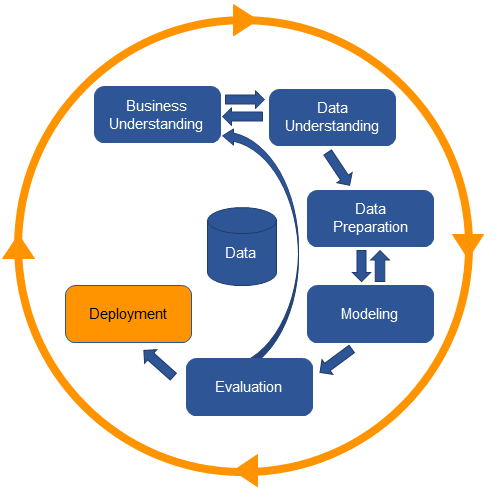

# EDA(Exploratory Data Analysis)

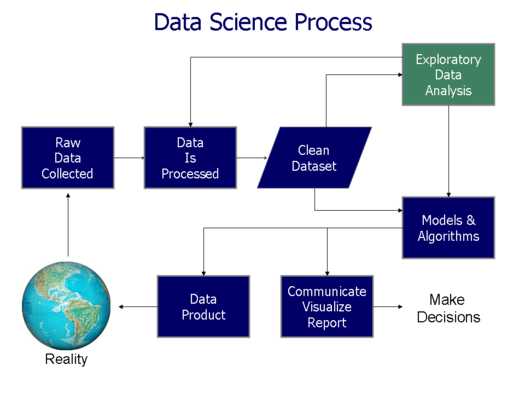

### Getting fimiliar with data


In [6]:
df.shape

(110867, 20)

In [7]:
# Checking the head of the dataset
df.head()

,Annual Income,Bankruptcies,Credit Score,Current Credit Balance,Current Loan Amount,Customer ID,Home Ownership,Loan ID,Loan Status,Maximum Open Credit,Monthly Debt,Months since last delinquent,Number of Credit Problems,Number of Open Accounts,Purpose,Tax Liens,Term,Years in current job,Years of Credit History,source
0,1167493.0,1.0,709.0,228190.0,445412.0,981165ec-3274-42f5-a3b4-d104041a9ca9,Home Mortgage,14dd8831-6af5-400b-83ec-68e61888a048,Fully Paid,416746.0,5214.74,NaN,1.0,6.0,Home Improvements,0.0,Short Term,8 years,17.2,train
1,NaN,0.0,NaN,229976.0,262328.0,2de017a3-2e01-49cb-a581-08169e83be29,Home Mortgage,4771cc26-131a-45db-b5aa-537ea4ba5342,Fully Paid,850784.0,33295.98,8.0,0.0,35.0,Debt Consolidation,0.0,Short Term,10+ years,21.1,train
2,2231892.0,0.0,741.0,297996.0,99999999.0,5efb2b2b-bf11-4dfd-a572-3761a2694725,Own Home,4eed4e6a-aa2f-4c91-8651-ce984ee8fb26,Fully Paid,750090.0,29200.53,29.0,1.0,18.0,Debt Consolidation,0.0,Short Term,8 years,14.9,train
3,806949.0,0.0,721.0,256329.0,347666.0,e777faab-98ae-45af-9a86-7ce5b33b1011,Own Home,77598f7b-32e7-4e3b-a6e5-06ba0d98fe8a,Fully Paid,386958.0,8741.90,NaN,0.0,9.0,Debt Consolidation,0.0,Long Term,3 years,12.0,train
4,NaN,0.0,NaN,253460.0,176220.0,81536ad9-5ccf-4eb8-befb-47a4d608658e,Rent,d4062e70-befa-4995-8643-a0de73938182,Fully Paid,427174.0,20639.70,NaN,0.0,15.0,Debt Consolidation,0.0,Short Term,5 years,6.1,train


#Here target (the Loan Status) is denoting if the certain variable is paid off or not.

In [8]:
df.tail()

,Annual Income,Bankruptcies,Credit Score,Current Credit Balance,Current Loan Amount,Customer ID,Home Ownership,Loan ID,Loan Status,Maximum Open Credit,Monthly Debt,Months since last delinquent,Number of Credit Problems,Number of Open Accounts,Purpose,Tax Liens,Term,Years in current job,Years of Credit History,source
110862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
110863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
110864,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
110865,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
110866,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test


 I saw that the last observations are NaN values, I will drop them right now.

# Handling Duplicate Data

In [9]:
train=train.drop_duplicates()
train['source']='train'
test['source']='test'
df_nodub = pd.concat([train,test],ignore_index=True, sort=True)
print(df.shape,df_nodub.shape,'\n Number of duplicate data : ',df.shape[0]-df_nodub.shape[0])

(110867, 20) (100139, 20) 
 Number of duplicate data :  10728


In [10]:
df=df_nodub

In [11]:
from pandas_profiling import ProfileReport

pandas_profiling extends the pandas DataFrame with df.profile_report() for quick data analysis.

For each column the following statistics - if relevant for the column type - are presented in an interactive HTML report:

Type inference: detect the types of columns in a dataframe.
Essentials: type, unique values, missing values
Quantile statistics like minimum value, Q1, median, Q3, maximum, range, interquartile range
Descriptive statistics like mean, mode, standard deviation, sum, median absolute deviation, coefficient of variation, kurtosis, skewness
Most frequent values
Histogram
Correlations highlighting of highly correlated variables, Spearman, Pearson and Kendall matrices
Missing values matrix, count, heatmap and dendrogram of missing values
Text analysis learn about categories (Uppercase, Space), scripts (Latin, Cyrillic) and blocks (ASCII) of text data.
File and Image analysis extract file sizes, creation dates and dimensions and scan for truncated images or those containing EXIF information.

In [12]:
pandas_profiling.ProfileReport(df)

In [13]:
#checking columns, datatypes, total records, and null Values 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100139 entries, 0 to 100138
Data columns (total 20 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   Annual Income                 78650 non-null   float64
 1   Bankruptcies                  99573 non-null   float64
 2   Credit Score                  78650 non-null   float64
 3   Current Credit Balance        99785 non-null   float64
 4   Current Loan Amount           99785 non-null   float64
 5   Customer ID                   99785 non-null   object 
 6   Home Ownership                99785 non-null   object 
 7   Loan ID                       99785 non-null   object 
 8   Loan Status                   89785 non-null   object 
 9   Maximum Open Credit           99783 non-null   float64
 10  Monthly Debt                  99785 non-null   float64
 11  Months since last delinquent  46142 non-null   float64
 12  Number of Credit Problems     99785 non-null

In [14]:
# counting missing values
df.apply(lambda x: sum(x.isnull()))

Annual Income                   21489
Bankruptcies                      566
Credit Score                    21489
Current Credit Balance            354
Current Loan Amount               354
Customer ID                       354
Home Ownership                    354
Loan ID                           354
Loan Status                     10354
Maximum Open Credit               356
Monthly Debt                      354
Months since last delinquent    53997
Number of Credit Problems         354
Number of Open Accounts           354
Purpose                           354
Tax Liens                         364
Term                              354
Years in current job             4583
Years of Credit History           354
source                              0
dtype: int64

In [15]:
#calculatin no. of missing values for each column and it's percentage
def percentage_of_miss():
  df1=df[df.columns[df.isnull().sum()>=1]]
  total_miss = df1.isnull().sum().sort_values(ascending=False)
  percent_miss = (df1.isnull().sum()/df1.isnull().count()).sort_values(ascending=False)
  missing_data = pd.concat([total_miss, percent_miss], axis=1, keys=['Number of Missing', 'Percentage'])
  return(missing_data)

#or
def percentage_of_miss():
  df1=df[df.columns[df.isnull().sum()>=1]]
  total_miss = df1.isnull().sum().sort_values(ascending=False)
  percent_miss = (df1.isnull().sum()/df.shape[0]).sort_values(ascending=False)
  missing_data = pd.concat([total_miss, percent_miss], axis=1, keys=['Number of Missing', 'Percentage'])
  return(missing_data)

In [16]:
percentage_of_miss()

,Number of Missing,Percentage
Months since last delinquent,53997,0.539220
Annual Income,21489,0.214592
Credit Score,21489,0.214592
Loan Status,10354,0.103396
Years in current job,4583,0.045766
Bankruptcies,566,0.005652
Tax Liens,364,0.003635
Maximum Open Credit,356,0.003555
Monthly Debt,354,0.003535
Number of Credit Problems,354,0.003535


In [17]:
df.tail(354)

,Annual Income,Bankruptcies,Credit Score,Current Credit Balance,Current Loan Amount,Customer ID,Home Ownership,Loan ID,Loan Status,Maximum Open Credit,Monthly Debt,Months since last delinquent,Number of Credit Problems,Number of Open Accounts,Purpose,Tax Liens,Term,Years in current job,Years of Credit History,source
99785,1079960.0,0.0,748.0,179018.0,99999999.0,f1838fa9-7ad9-44d5-97a6-7a6d3f3529d7,Home Mortgage,14f94b64-26c4-48fd-b916-1388d7adcc1d,NaN,607882.0,12239.61,NaN,0.0,14.0,Debt Consolidation,0.0,Short Term,6 years,19.7,test
99786,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
99787,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
99788,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
99789,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100134,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
100135,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
100136,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test
100137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,test


The last 353 observations are NaN values and belongs to test data set

In [18]:
#gettin columns' names spicially sometimes there is a space or unders score in some columns' names
df_columns=df.columns
print(df_columns)

Index(['Annual Income', 'Bankruptcies', 'Credit Score',
       'Current Credit Balance', 'Current Loan Amount', 'Customer ID',
       'Home Ownership', 'Loan ID', 'Loan Status', 'Maximum Open Credit',
       'Monthly Debt', 'Months since last delinquent',
       'Number of Credit Problems', 'Number of Open Accounts', 'Purpose',
       'Tax Liens', 'Term', 'Years in current job', 'Years of Credit History',
       'source'],
      dtype='object')


In [19]:
col=[]
for i in df.columns:
    col.append(i.replace("_"," "))    
df.columns=col    

In [20]:
#categrocial variables
df_cat=df.select_dtypes(include='object')
df_cat.columns

Index(['Customer ID', 'Home Ownership', 'Loan ID', 'Loan Status', 'Purpose',
       'Term', 'Years in current job', 'source'],
      dtype='object')

In [21]:
#numerical variables
df_num=df.select_dtypes(exclude='object')# Just get me the numeric variables
df_num.columns

Index(['Annual Income', 'Bankruptcies', 'Credit Score',
       'Current Credit Balance', 'Current Loan Amount', 'Maximum Open Credit',
       'Monthly Debt', 'Months since last delinquent',
       'Number of Credit Problems', 'Number of Open Accounts', 'Tax Liens',
       'Years of Credit History'],
      dtype='object')

#### Dropping Irrelevant Feature

In [22]:
#### dropping features are only for identification
df.drop(labels=['Loan ID', 'Customer ID'], axis=1, inplace=True)

### The statistical summary of the dataset

In [23]:
# Getting the summary of Data
pd.options.display.float_format = "{:.2f}".format
df.describe()# for numeric columns

,Annual Income,Bankruptcies,Credit Score,Current Credit Balance,Current Loan Amount,Maximum Open Credit,Monthly Debt,Months since last delinquent,Number of Credit Problems,Number of Open Accounts,Tax Liens,Years of Credit History
count,78650.00,99573.00,78650.00,99785.00,99785.00,99783.00,99785.00,46142.00,99785.00,99785.00,99775.00,99785.00
mean,1375202.26,0.12,1125.44,293703.91,12914871.42,766784.68,18400.19,34.97,0.17,11.12,0.03,18.25
std,1083135.66,0.35,1561.83,373855.19,33132296.89,8371541.25,12170.99,21.97,0.48,5.00,0.26,7.03
min,76627.00,0.00,585.00,0.00,10802.00,0.00,0.00,0.00,0.00,0.00,0.00,3.60
25%,848003.25,0.00,708.00,112423.00,180158.00,276441.00,10162.72,16.00,0.00,8.00,0.00,13.50
50%,1168690.00,0.00,728.00,209551.00,313500.00,471702.00,16133.66,32.00,0.00,10.00,0.00,17.00
75%,1649732.00,0.00,742.00,367061.00,530794.00,791142.00,23913.97,51.00,0.00,14.00,0.00,21.70
max,165557393.00,7.00,7510.00,32878968.00,99999999.00,1539737892.00,435843.28,176.00,15.00,76.00,15.00,70.50


In [24]:
#finding unique values, mode and fequency of mode
#Method 1
df.astype('object').describe().transpose()

,count,unique,top,freq
Annual Income,78650.00,37853.00,1162572.00,23.00
Bankruptcies,99573.00,8.00,0.00,88775.00
Credit Score,78650.00,326.00,747.00,2022.00
Current Credit Balance,99785.00,33641.00,0.00,581.00
Current Loan Amount,99785.00,22502.00,99999999.00,12617.00
Home Ownership,99785,4,Home Mortgage,48415
Loan Status,89785,2,Fully Paid,67146
Maximum Open Credit,99783.00,46468.00,0.00,690.00
Monthly Debt,99785.00,69750.00,0.00,78.00
Months since last delinquent,46142.00,116.00,13.00,885.00


In [25]:
#Method 2
#finding just unique values
df.apply(lambda x: len(x.unique()))

Annual Income                   37854
Bankruptcies                        9
Credit Score                      327
Current Credit Balance          33642
Current Loan Amount             22503
Home Ownership                      5
Loan Status                         3
Maximum Open Credit             46469
Monthly Debt                    69751
Months since last delinquent      117
Number of Credit Problems          15
Number of Open Accounts            53
Purpose                            17
Tax Liens                          14
Term                                3
Years in current job               12
Years of Credit History           508
source                              2
dtype: int64

In [26]:
#Find the Frequency of each items
#method1
#categrocial variables
df_cat=df.select_dtypes(include='object')
#Exclude ID cols and Source
#df_cat.drop(labels=['Loan_ID', 'Customer_ID'], axis=1, inplace=True)#I excluded Id cols before
df_cat.drop(labels=['source'], axis=1, inplace=True)
df_cat.apply(lambda x:print( x.value_counts()))

Home Mortgage    48415
Rent             42058
Own Home          9113
HaveMortgage       199
Name: Home Ownership, dtype: int64
Fully Paid     67146
Charged Off    22639
Name: Loan Status, dtype: int64
Debt Consolidation      78712
Home Improvements        5830
other                    5796
Other                    3190
Business Loan            1529
Buy a Car                1307
Medical Bills            1096
Buy House                 652
Take a Trip               532
major_purchase            382
small_business            286
moving                    149
wedding                   115
Educational Expenses      105
vacation                   95
renewable_energy            9
Name: Purpose, dtype: int64
Short Term    73318
Long Term     26467
Name: Term, dtype: int64
10+ years    30840
2 years       9170
3 years       8205
< 1 year      8160
5 years       6832
1 year        6480
4 years       6124
6 years       5700
7 years       5543
8 years       4593
9 years       3909
Name: Years in cu

Home Ownership          None
Loan Status             None
Purpose                 None
Term                    None
Years in current job    None
dtype: object

In [27]:
#Method 2
# Filter categorical variables
categorical_columns= {x for x in df.dtypes.index if df.dtypes[x]=='object'}
#or
#categorical_columns= [x for x in df.dtypes.index if df.dtypes[x]=='object']
#exculde Id cols and source:
#categorical_columns= [ x for x in categorical_columns
#                     if x not in ['Loan_ID', 'Customer_ID']]
#Print frequencey of categories
for col in categorical_columns:
    print ('\nFrequency of Categories for varible %s'%col)
    print(df[col].value_counts())


Frequency of Categories for varible Loan Status
Fully Paid     67146
Charged Off    22639
Name: Loan Status, dtype: int64

Frequency of Categories for varible Years in current job
10+ years    30840
2 years       9170
3 years       8205
< 1 year      8160
5 years       6832
1 year        6480
4 years       6124
6 years       5700
7 years       5543
8 years       4593
9 years       3909
Name: Years in current job, dtype: int64

Frequency of Categories for varible Term
Short Term    73318
Long Term     26467
Name: Term, dtype: int64

Frequency of Categories for varible Home Ownership
Home Mortgage    48415
Rent             42058
Own Home          9113
HaveMortgage       199
Name: Home Ownership, dtype: int64

Frequency of Categories for varible Purpose
Debt Consolidation      78712
Home Improvements        5830
other                    5796
Other                    3190
Business Loan            1529
Buy a Car                1307
Medical Bills            1096
Buy House                 65

In [28]:
#Method 3
# Filter categorical variables
df_cat=df.select_dtypes(include='object')
#Exclude ID cols and Source
#df_cat.drop(labels=['Loan_ID', 'Customer_ID'], axis=1, inplace=True)#I excluded Id cols before
df_cat.drop(labels=['source'], axis=1, inplace=True)
categorical_columns= df_cat.columns
for col in categorical_columns:
    print ('\nFrequency of Categories for varible %s'%col)
    print(df[col].value_counts())


Frequency of Categories for varible Home Ownership
Home Mortgage    48415
Rent             42058
Own Home          9113
HaveMortgage       199
Name: Home Ownership, dtype: int64

Frequency of Categories for varible Loan Status
Fully Paid     67146
Charged Off    22639
Name: Loan Status, dtype: int64

Frequency of Categories for varible Purpose
Debt Consolidation      78712
Home Improvements        5830
other                    5796
Other                    3190
Business Loan            1529
Buy a Car                1307
Medical Bills            1096
Buy House                 652
Take a Trip               532
major_purchase            382
small_business            286
moving                    149
wedding                   115
Educational Expenses      105
vacation                   95
renewable_energy            9
Name: Purpose, dtype: int64

Frequency of Categories for varible Term
Short Term    73318
Long Term     26467
Name: Term, dtype: int64

Frequency of Categories for varible Y

# UNIVARIATE AND BIVARIATE ANAYSIS
**********************************

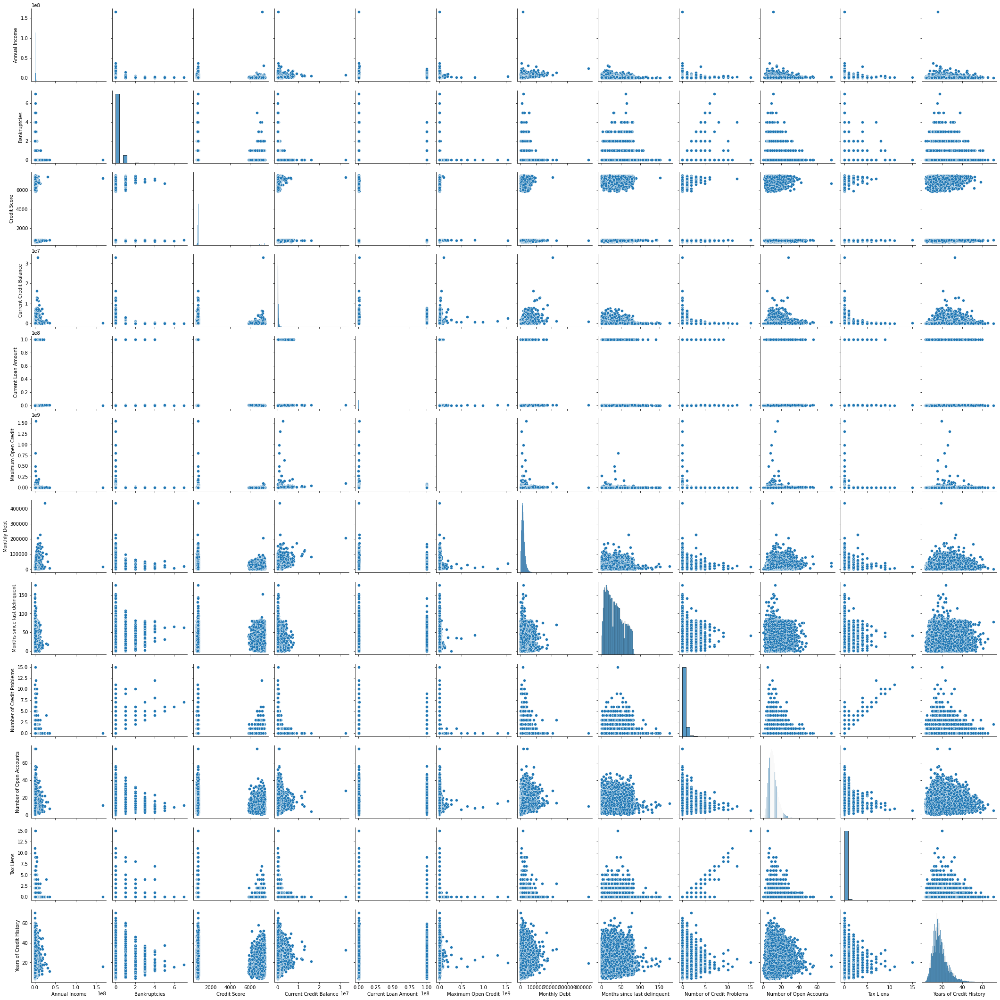

In [29]:
sns.pairplot(df)

# Going through columns one by one  

### Target: Loan Status

In [30]:
Loan_Status=df['Loan Status'].value_counts()
Loan_Status

Fully Paid     67146
Charged Off    22639
Name: Loan Status, dtype: int64

Text(0.5, 1, 'Class counts')

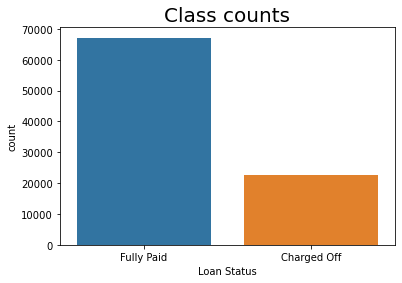

In [31]:
#countplot
sns.countplot(df['Loan Status'])
plt.title("Class counts", y=1, fontdict={"fontsize": 20})

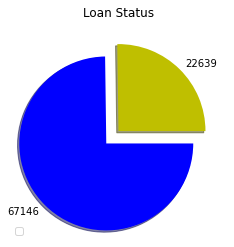

In [32]:
#Pie chart

values = [Loan_Status[0],Loan_Status[1]]
colors = ['b', 'y']
labels = ['Fully Paid','Charged Off']
explode = (0.2, 0)
plt.title('Loan Status')
plt.legend(labels,loc=3)
plt.pie(values, colors=colors, labels= values,explode=explode,
        counterclock=False, shadow=True)

plt.show()

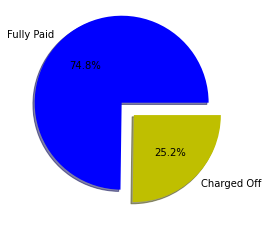

In [33]:
#Percentage
plt.pie(values, colors=colors, labels=labels,
explode=explode, autopct='%1.1f%%', counterclock=True, shadow=True)

plt.show()


### As you can see data is imbalanced. Accuracy is not the best metric to use when evaluating imbalanced datasets as it can be very misleading. F1 is a suitable measure of models tested with imbalance datasets. 

#### Current Loan Amount

In [34]:
df['Current Loan Amount'].describe()

count      99785.00
mean    12914871.42
std     33132296.89
min        10802.00
25%       180158.00
50%       313500.00
75%       530794.00
max     99999999.00
Name: Current Loan Amount, dtype: float64

<AxesSubplot:ylabel='Current Loan Amount'>

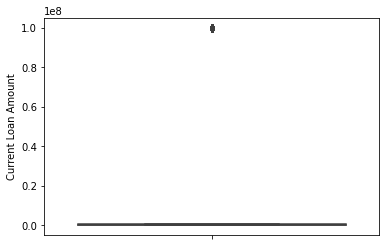

In [35]:
sns.boxplot( y=df['Current Loan Amount'] )

##### Let's take a look at behavior of outliers closely

In [36]:
#lower inner fence: Q1 - 1.5*IQR
#upper inner fence: Q3 + 1.5*IQR
def outlier_analysis(col):
    Q1=df[col].quantile(0.25)
    Q3=df[col].quantile(0.75)
    IQR=Q3-Q1
    UIF=Q3+1.5*(IQR)
    LIF=Q1-1.5*(IQR)
    df_out =df[(df[col]<LIF) | (df[col]>UIF)] 
    sns.distplot(df_out[col])#Plotting univariate distributions.By default, this will draw a histogram and fit a kernel density estimate (KDE)
   
    return df_out[col] .describe()

count      12617.00
mean    99999999.00
std            0.00
min     99999999.00
25%     99999999.00
50%     99999999.00
75%     99999999.00
max     99999999.00
Name: Current Loan Amount, dtype: float64

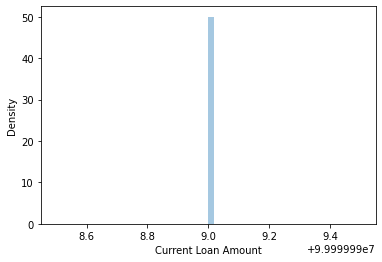

In [37]:
outlier_analysis('Current Loan Amount')

#it looks like instead of NaN  for Current.Loan.Amount in some observation we have 99999999.I will fix it.

#### Term

In [38]:
df['Term'].value_counts()

Short Term    73318
Long Term     26467
Name: Term, dtype: int64

Text(0.5, 1, 'Term')

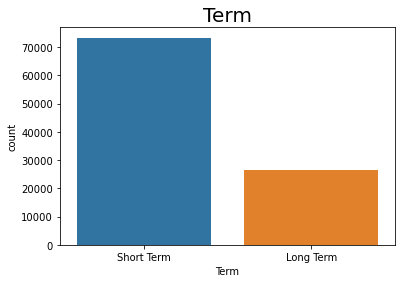

In [39]:
#countplot
sns.countplot(df['Term'])
plt.title("Term", y=1, fontdict={"fontsize": 20})

([<matplotlib.patches.Wedge at 0x241b7fc2f48>,
 [Text(-0.8741902878270721, 0.9621805135570046, 'Short Term'),
  Text(0.7396994743152143, -0.8141527422405428, 'Long Term')],
 [Text(-0.537963254047429, 0.5921110852658489, '73.5%'),
  Text(0.4034724405355714, -0.44408331394938694, '26.5%')])

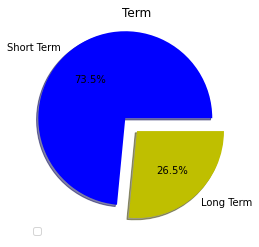

In [40]:
Term=df['Term'].value_counts()
values = [Term[0],Term[1]]
colors = ['b', 'y']
labels = ['Short Term','Long Term']
explode = (0.2, 0)
plt.title('Term')
plt.legend(labels,loc=3)
plt.pie(values, colors=colors, labels=labels,
explode=explode, autopct='%1.1f%%', counterclock=True, shadow=True)

### The Null and Alternate Hypotheses

Recall that we are interested in knowing if there is a relationship between 'Term' and 'Loan Status'. In order to do so, we would have to use the Chi-squared test. But first, let's state our null hypothesis and the alternative hypothesis.

H0:There is no statistically significant relationship between Term and Loan Status.

Ha:There is a statistically significant relationship between Term and Loan Status.

Constructing the Contingency Table
The next step is to format the data into a frequency count table. This is called a Contingency Table, we can accomplish this by using the pd.crosstab() function in pandas.

In [41]:
contingency_table1 = pd.crosstab(df['Term'],df['Loan Status'],margins = True)
contingency_table1.transpose()

Term,Long Term,Short Term,All
Loan Status,,,
Charged Off,8366,14273,22639
Fully Paid,15396,51750,67146
All,23762,66023,89785


# Chi-square test of independence

In [42]:
from scipy.stats.contingency import chi2_contingency

chi_2, p_val, dof, exp_val = chi2_contingency(contingency_table1)

print('Chi-square is %f'%chi_2, '\n\np_value is %f'%p_val, '\n\ndegree of freedom is %i'%dof)

if p_val < 0.05:
    print("\nThere is some correlation between the two variables at significance level 0.05")
else:
    print("\nThere is no correlation between the two variables")

Chi-square is 1711.179759 

p_value is 0.000000 

degree of freedom is 4

There is some correlation between the two variables at significance level 0.05


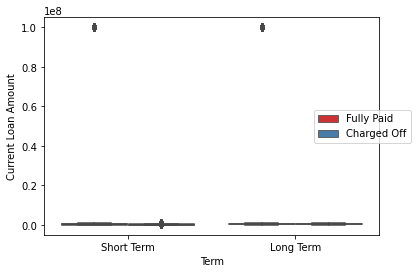

In [43]:
 ax = sns.boxplot(x="Term", y="Current Loan Amount", hue="Loan Status",
               data=df, palette="Set1")
ax.legend(loc=6,borderaxespad=27)

In [44]:
df.groupby(['Loan Status',"Term"]).agg({"Current Loan Amount":np.mean})

Current Loan Amount
Loan Status Term                           
Charged Off Long Term             434414.05
            Short Term            260828.57
Fully Paid  Long Term           15420108.01
            Short Term          17930576.53

### Credit Score

In [45]:
df['Credit Score'].describe()

count   78650.00
mean     1125.44
std      1561.83
min       585.00
25%       708.00
50%       728.00
75%       742.00
max      7510.00
Name: Credit Score, dtype: float64

count   8005.00
mean    4681.85
std     3143.54
min      585.00
25%      647.00
50%     6880.00
75%     7260.00
max     7510.00
Name: Credit Score, dtype: float64

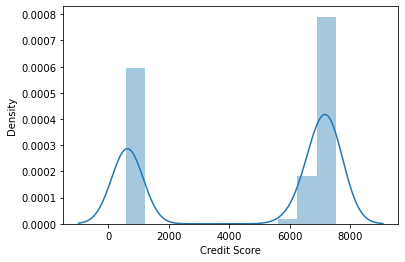

In [46]:
outlier_analysis('Credit Score')

<AxesSubplot:xlabel='Credit Score', ylabel='Density'>

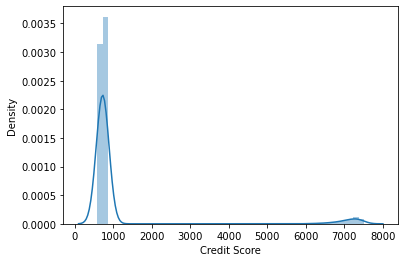

In [47]:
df_1= df.drop(df.loc[df['Credit Score'].isnull()].index)

sns.distplot(df_1['Credit Score'])#Plotting univariate distributions.By default, this will draw a histogram and fit a kernel density estimate (KDE). 


#If you notice the maximum of credit scoe is 7510 which is strange considering the credit score are within the range of 300-850.

<AxesSubplot:xlabel='Credit Score'>

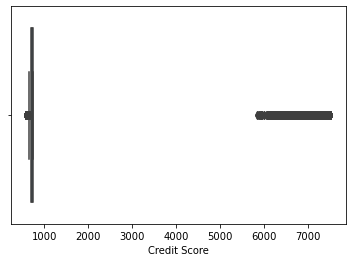

In [48]:
sns.boxplot(x=df['Credit Score'])

In [49]:
dfc =df[df['Credit Score']>850] 
dfc['Credit Score'].describe()

count   5004.00
mean    7108.86
std      306.27
min     5850.00
25%     6950.00
50%     7190.00
75%     7350.00
max     7510.00
Name: Credit Score, dtype: float64

In [50]:
len(dfc['Credit Score'])-len([x for x in dfc['Credit Score']%10==0])


0

#It looks like some of the credit score are just scaled up by 10, so I will fix it.

### Annual Income

In [51]:
df['Annual Income'].describe()

count       78650.00
mean      1375202.26
std       1083135.66
min         76627.00
25%        848003.25
50%       1168690.00
75%       1649732.00
max     165557393.00
Name: Annual Income, dtype: float64

<AxesSubplot:xlabel='Annual Income'>

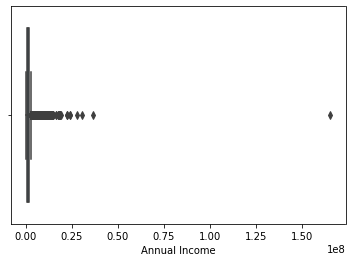

In [52]:
sns.boxplot(x=df['Annual Income'])

count        3663.00
mean      4143542.80
std       3339461.55
min       2852565.00
25%       3089865.50
50%       3491269.00
75%       4301248.50
max     165557393.00
Name: Annual Income, dtype: float64

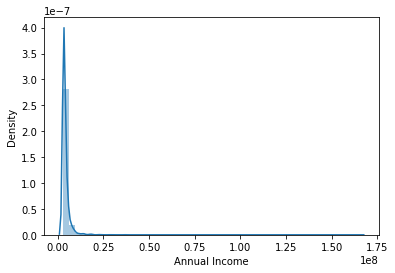

In [53]:
outlier_analysis('Annual Income')

#There are a lot of noises and outliers here that I will drop them.That is why I prefer handling outliers before handling missing values

### Years in current job

In [54]:
df['Years in current job'].value_counts()

10+ years    30840
2 years       9170
3 years       8205
< 1 year      8160
5 years       6832
1 year        6480
4 years       6124
6 years       5700
7 years       5543
8 years       4593
9 years       3909
Name: Years in current job, dtype: int64

In [55]:
contingency_table2= pd.crosstab(df['Loan Status'],df['Years in current job'],margins = True)
contingency_table2

Years in current job,1 year,10+ years,2 years,3 years,4 years,5 years,6 years,7 years,8 years,9 years,< 1 year,All
Loan Status,,,,,,,,,,,,
Charged Off,1493,6724,2002,1730,1376,1532,1320,1289,1051,942,1908,21367
Fully Paid,4339,21031,6252,5609,4135,4604,3814,3700,3070,2605,5457,64616
All,5832,27755,8254,7339,5511,6136,5134,4989,4121,3547,7365,85983


### Visualizing the Contingency Table with a Stacked Bar Chart

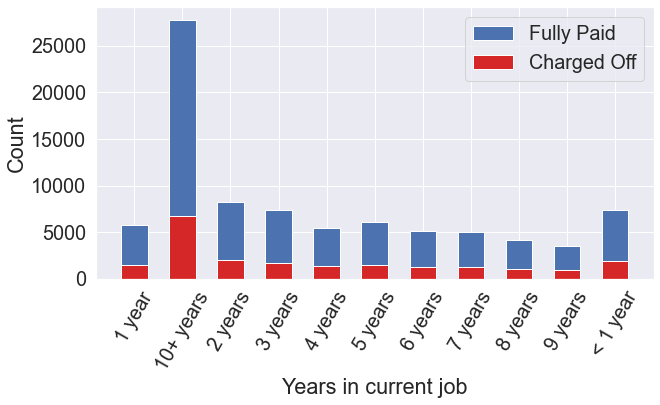

In [56]:
#Assigns the frequency values
ChargedOff = contingency_table2.iloc[0][0:11].values
FullyPaid = contingency_table2.iloc[1][0:11].values

#Plots the bar chart
fig = plt.figure(figsize=(10, 5))
sns.set(font_scale=1.8)
categories = ["1 year","10+ years","2 years","3 years","4 years","5 years","6 years","7 years",
              "8 years","9 years","< 1 year"]
p1 = plt.bar(categories, ChargedOff, 0.55, color='#d62728')
p2 = plt.bar(categories, FullyPaid, 0.55, bottom=ChargedOff)
plt.legend((p2[0], p1[0]), ('Fully Paid', 'Charged Off'))
plt.xlabel('Years in current job')
plt.xticks(rotation=60)
plt.ylabel('Count')
plt.show()

#### Chi-square test of independence

In [57]:
chi_2, p_val, dof, exp_val = chi2_contingency(contingency_table2)
print('Chi-square is %f'%chi_2, '\n\np_value is %f'%p_val, '\n\ndegree of freedom is %i'%dof)

if p_val < 0.05:
    print("\nThere is some correlation between the two variables at significance level 0.05")
else:
    print("\nThere is no correlation between the two variables")

Chi-square is 31.123702 

p_value is 0.093612 

degree of freedom is 22

There is no correlation between the two variables


In [58]:
df['Years in current job'].value_counts()

10+ years    30840
2 years       9170
3 years       8205
< 1 year      8160
5 years       6832
1 year        6480
4 years       6124
6 years       5700
7 years       5543
8 years       4593
9 years       3909
Name: Years in current job, dtype: int64

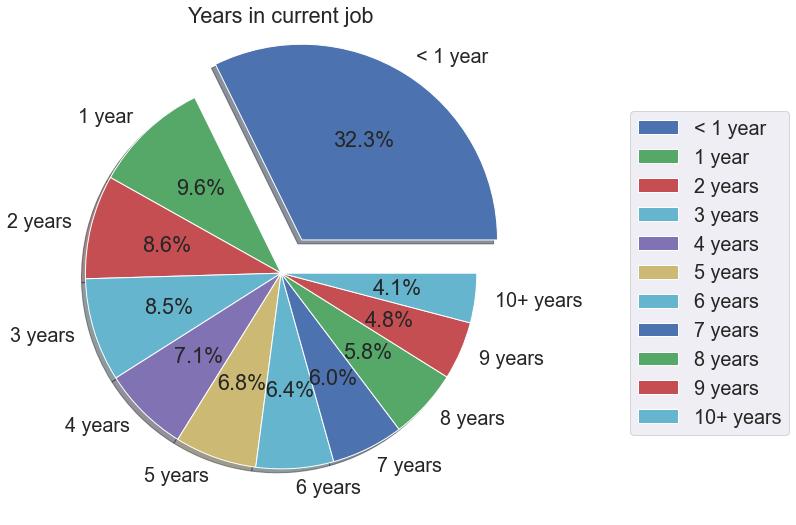

In [59]:
#Pie chart
plt.figure(figsize=(9,9))
years=df['Years in current job'].value_counts()
values = [years[0], years[1], years[2],years[3], years[4], years[5],years[6],years[7], years[8],years[9], years[10]]
colors = ['b', 'g', 'r', 'c', 'm', 'y','c','b', 'g', 'r', 'c']
labels = ['< 1 year','1 year','2 years','3 years','4 years','5 years','6 years','7 years','8 years','9 years','10+ years']
explode = (.2, 0, 0, 0, 0, 0,0,0,0,0,0)
plt.pie(values, colors=colors, labels=labels,explode=explode, autopct='%1.1f%%', counterclock=True, shadow=True)
plt.title('Years in current job')
plt.legend(labels,loc=6,borderaxespad=30)

plt.show()

In [60]:
HL=df.groupby(['Years in current job']).agg({'Annual Income':np.mean})
HL

,Annual Income
Years in current job,
1 year,1290271.03
10+ years,1513822.27
2 years,1346066.06
3 years,1330352.34
4 years,1327670.15
5 years,1337205.89
6 years,1347156.85
7 years,1392009.60
8 years,1394145.92


#### Home Ownership

In [61]:
df['Home Ownership'].value_counts()

Home Mortgage    48415
Rent             42058
Own Home          9113
HaveMortgage       199
Name: Home Ownership, dtype: int64

In [62]:
#I will replace 'HaveMortgage' with 'Home Mortgage' in feature engineering part

#### Purpose

In [63]:
df['Purpose'].value_counts()

Debt Consolidation      78712
Home Improvements        5830
other                    5796
Other                    3190
Business Loan            1529
Buy a Car                1307
Medical Bills            1096
Buy House                 652
Take a Trip               532
major_purchase            382
small_business            286
moving                    149
wedding                   115
Educational Expenses      105
vacation                   95
renewable_energy            9
Name: Purpose, dtype: int64

In [64]:
# we have other and Other in 'Purpose'
df['Purpose']=df['Purpose'].replace('other', 'Other')
#method2: df['Purpose'] = df['Purpose'].str.lower()

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'Home Improvements'),
  Text(1, 0, 'Debt Consolidation'),
  Text(2, 0, 'Buy House'),
  Text(3, 0, 'Other'),
  Text(4, 0, 'Business Loan'),
  Text(5, 0, 'Buy a Car'),
  Text(6, 0, 'major_purchase'),
  Text(7, 0, 'Take a Trip'),
  Text(8, 0, 'small_business'),
  Text(9, 0, 'Medical Bills'),
  Text(10, 0, 'wedding'),
  Text(11, 0, 'vacation'),
  Text(12, 0, 'Educational Expenses'),
  Text(13, 0, 'moving'),
  Text(14, 0, 'renewable_energy')])

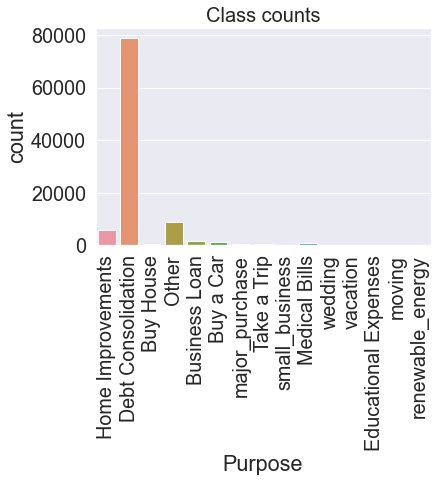

In [65]:
sns.countplot(df['Purpose'])
plt.title("Class counts", y=1, fontdict={"fontsize": 20})
plt.xticks(rotation=90)

In [66]:
contigency_table= pd.crosstab(df['Purpose'],df['Loan Status'])
contigency_table

Loan Status,Charged Off,Fully Paid
Purpose,,
Business Loan,478,888
Buy House,140,442
Buy a Car,203,962
Debt Consolidation,17918,52916
Educational Expenses,18,73
Home Improvements,1163,4074
Medical Bills,278,705
Other,2026,6091
Take a Trip,115,373


In [67]:
chi_2, p_val, dof, exp_val = chi2_contingency(contigency_table)

print('Chi-square is %f'%chi_2, '\n\np_value is %f'%p_val, '\n\ndegree of freedom is %i'%dof)

if p_val < 0.05:
    print("\nThere is some correlation between the two variables at significance level 0.05")
else:
    print("\nThere is no correlation between the two variables")

Chi-square is 211.024758 

p_value is 0.000000 

degree of freedom is 14

There is some correlation between the two variables at significance level 0.05


#### Monthly Debt

In [68]:
df['Monthly Debt'].describe()

count    99785.00
mean     18400.19
std      12170.99
min          0.00
25%      10162.72
50%      16133.66
75%      23913.97
max     435843.28
Name: Monthly Debt, dtype: float64

<AxesSubplot:xlabel='Monthly Debt'>

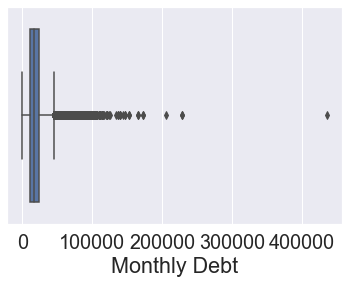

In [69]:
sns.boxplot(x=df['Monthly Debt'])

#There are a lot of noises and outliers here that I will drop them.

#### Years of Credit History

In [70]:
df['Years of Credit History'].describe()

count   99785.00
mean       18.25
std         7.03
min         3.60
25%        13.50
50%        17.00
75%        21.70
max        70.50
Name: Years of Credit History, dtype: float64

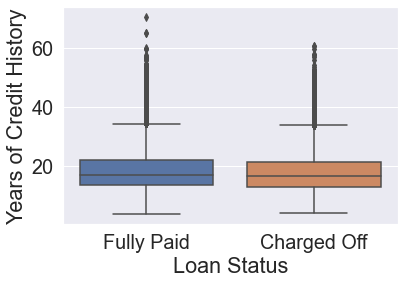

In [71]:
ax = sns.boxplot(x='Loan Status', y='Years of Credit History', data=df)

In [72]:
df.groupby(['Loan Status']).agg({'Years of Credit History':np.mean})

,Years of Credit History
Loan Status,
Charged Off,17.89
Fully Paid,18.37


#### Months since last delinquent

In [73]:
df['Months since last delinquent'].describe()

count   46142.00
mean       34.97
std        21.97
min         0.00
25%        16.00
50%        32.00
75%        51.00
max       176.00
Name: Months since last delinquent, dtype: float64

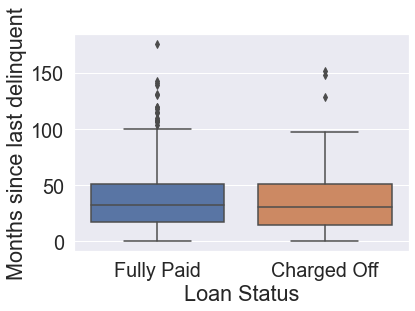

In [74]:
ax = sns.boxplot(x='Loan Status', y='Months since last delinquent', data=df)

In [75]:
df.groupby(['Loan Status']).agg({'Months since last delinquent':np.mean})

,Months since last delinquent
Loan Status,
Charged Off,34.34
Fully Paid,35.19


#### Number of Open Accounts

In [76]:
df['Number of Open Accounts'].describe()

count   99785.00
mean       11.12
std         5.00
min         0.00
25%         8.00
50%        10.00
75%        14.00
max        76.00
Name: Number of Open Accounts, dtype: float64

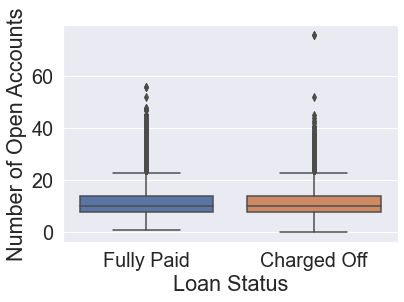

In [77]:
ax = sns.boxplot(x='Loan Status', y='Number of Open Accounts', data=df)

In [78]:
df.groupby(['Loan Status']).agg({'Number of Open Accounts':np.mean})

,Number of Open Accounts
Loan Status,
Charged Off,11.24
Fully Paid,11.08


#### Number of Credit Problems

In [79]:
df['Number of Credit Problems'].describe()

count   99785.00
mean        0.17
std         0.48
min         0.00
25%         0.00
50%         0.00
75%         0.00
max        15.00
Name: Number of Credit Problems, dtype: float64

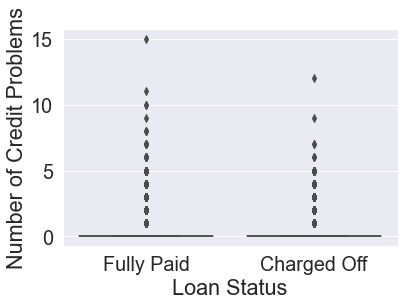

In [80]:
ax = sns.boxplot(x='Loan Status', y='Number of Credit Problems', data=df)

In [81]:
df.groupby(['Loan Status']).agg({'Number of Credit Problems':np.mean})

,Number of Credit Problems
Loan Status,
Charged Off,0.17
Fully Paid,0.16


#### Current Credit Balance

In [82]:
df['Current Credit Balance'].describe()


count      99785.00
mean      293703.91
std       373855.19
min            0.00
25%       112423.00
50%       209551.00
75%       367061.00
max     32878968.00
Name: Current Credit Balance, dtype: float64

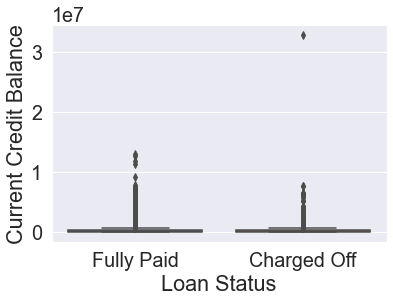

In [83]:
ax = sns.boxplot(x='Loan Status', y='Current Credit Balance', data=df)

In [84]:
#There are a lot of noises and outliers here that I will drop them.

#### Maximum Open Credit

In [85]:
df['Maximum Open Credit'].describe()

count        99783.00
mean        766784.68
std        8371541.25
min              0.00
25%         276441.00
50%         471702.00
75%         791142.00
max     1539737892.00
Name: Maximum Open Credit, dtype: float64

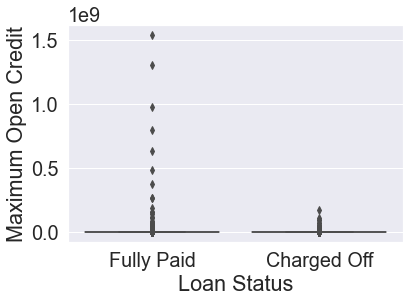

In [86]:
ax = sns.boxplot(x='Loan Status', y='Maximum Open Credit', data=df)

In [87]:
#There are a lot of noises and outliers here that I will drop them.

#### Bankruptcies

In [88]:
df['Bankruptcies'].describe()

count   99573.00
mean        0.12
std         0.35
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         7.00
Name: Bankruptcies, dtype: float64

In [89]:
df['Bankruptcies'].value_counts()

0.00    88775
1.00    10255
2.00      415
3.00       96
4.00       24
5.00        6
7.00        1
6.00        1
Name: Bankruptcies, dtype: int64

Text(0.5, 1, 'Class counts')

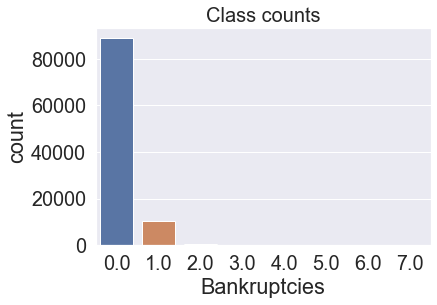

In [90]:
sns.countplot(df['Bankruptcies'])
plt.title("Class counts", y=1, fontdict={"fontsize": 20})

In [91]:
contigency_table= pd.crosstab(df['Bankruptcies'],df['Loan Status'])
contigency_table

Loan Status,Charged Off,Fully Paid
Bankruptcies,,
0.00,20183,59697
1.00,2287,6946
2.00,92,277
3.00,18,64
4.00,7,17
5.00,2,3
6.00,0,1
7.00,0,1


In [92]:
chi_2, p_val, dof, exp_val = chi2_contingency(contigency_table)

print('Chi-square is %f'%chi_2, '\n\np_value is %f'%p_val, '\n\ndegree of freedom is %i'%dof)

if p_val < 0.05:
    print("\nThere is some correlation between the two variables at significance level 0.05")
else:
    print("\nThere is no correlation between the two variables")

Chi-square is 3.014693 

p_value is 0.883640 

degree of freedom is 7

There is no correlation between the two variables


#### Tax Liens

In [93]:
df['Tax Liens'].describe()

count   99775.00
mean        0.03
std         0.26
min         0.00
25%         0.00
50%         0.00
75%         0.00
max        15.00
Name: Tax Liens, dtype: float64

In [94]:
df['Tax Liens'].value_counts()

0.00     97900
1.00      1305
2.00       354
3.00       113
4.00        60
5.00        17
6.00        10
7.00         6
9.00         5
8.00         2
15.00        1
11.00        1
10.00        1
Name: Tax Liens, dtype: int64

<AxesSubplot:xlabel='Tax Liens', ylabel='count'>

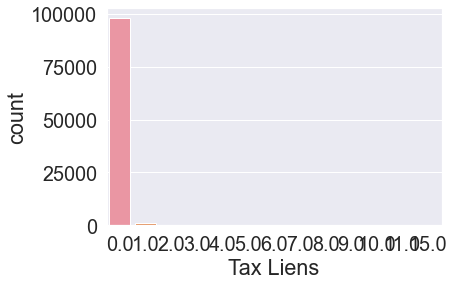

In [95]:
#countplot
sns.countplot(df['Tax Liens'])

In [96]:
df.groupby(['Loan Status']).agg({'Tax Liens':np.mean})

,Tax Liens
Loan Status,
Charged Off,0.03
Fully Paid,0.03


In [97]:
df.astype('object').describe().transpose()

,count,unique,top,freq
Annual Income,78650.00,37853.00,1162572.00,23.00
Bankruptcies,99573.00,8.00,0.00,88775.00
Credit Score,78650.00,326.00,747.00,2022.00
Current Credit Balance,99785.00,33641.00,0.00,581.00
Current Loan Amount,99785.00,22502.00,99999999.00,12617.00
Home Ownership,99785,4,Home Mortgage,48415
Loan Status,89785,2,Fully Paid,67146
Maximum Open Credit,99783.00,46468.00,0.00,690.00
Monthly Debt,99785.00,69750.00,0.00,78.00
Months since last delinquent,46142.00,116.00,13.00,885.00


# """Feature Engineering"""

### 1)Find and Replace

#### Current Loan Amount

In [98]:
#It looks like instead of NaN  for Current.Loan.Amount in some observation we have 99999999.Let me fix it.

In [99]:
df['Current Loan Amount']=df['Current Loan Amount'].replace(99999999, np.NaN)

In [100]:
df['Current Loan Amount'].describe()

count    87168.00
mean    309866.66
std     184229.21
min      10802.00
25%     172150.00
50%     266222.00
75%     430892.00
max     789250.00
Name: Current Loan Amount, dtype: float64

<AxesSubplot:ylabel='Current Loan Amount'>

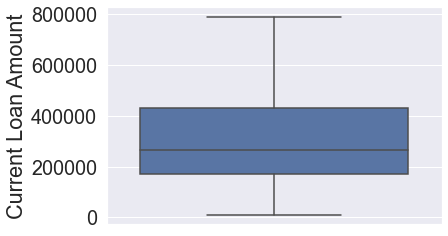

In [101]:
sns.boxplot( y=df['Current Loan Amount'] )

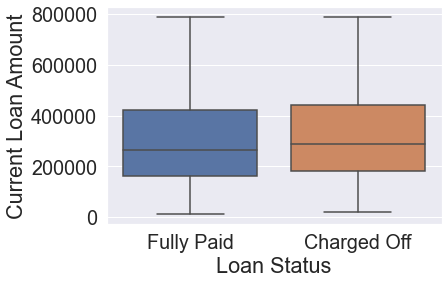

In [102]:
ax = sns.boxplot(x='Loan Status', y='Current Loan Amount', data=df)

In [103]:
df.groupby(['Loan Status']).agg({'Current Loan Amount':np.mean})

,Current Loan Amount
Loan Status,
Charged Off,324975.23
Fully Paid,303893.67


#### Credit Score

In [104]:
#It looks like some of the credit score are just scaled up by 10, so I will fix it.

In [105]:
df['Credit Score'] = df['Credit Score'].apply(lambda val: (val /10) if (val>850 and val%10==0) else val)

In [106]:
df['Credit Score'].describe()

count   78650.00
mean      718.38
std        28.14
min       585.00
25%       706.00
50%       725.00
75%       740.00
max       751.00
Name: Credit Score, dtype: float64

<AxesSubplot:xlabel='Credit Score', ylabel='Density'>

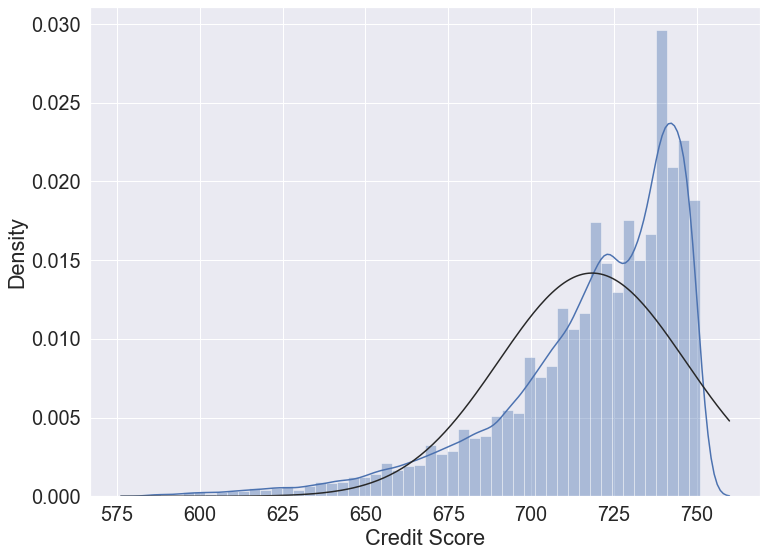

In [107]:
df_1= df.drop(df.loc[df['Credit Score'].isnull()].index)
from scipy.stats import norm
plt.figure(figsize=(12,9))
sns.distplot(df_1['Credit Score'], fit= norm)

In [108]:
#skewness and kurtosis
print("Skewness: %f" % df_1['Credit Score'].skew())
print("Kurtosis: %f" % df_1['Credit Score'].kurt())

Skewness: -1.440363
Kurtosis: 2.270842


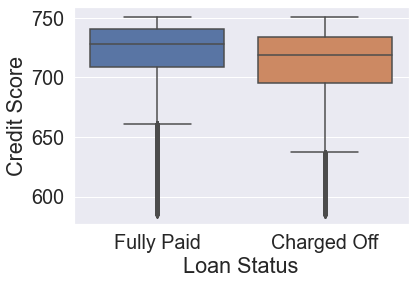

In [109]:
ax = sns.boxplot(x='Loan Status', y='Credit Score', data=df)

In [110]:
df.groupby(['Loan Status']).agg({'Credit Score':np.mean})

,Credit Score
Loan Status,
Charged Off,710.39
Fully Paid,721.22


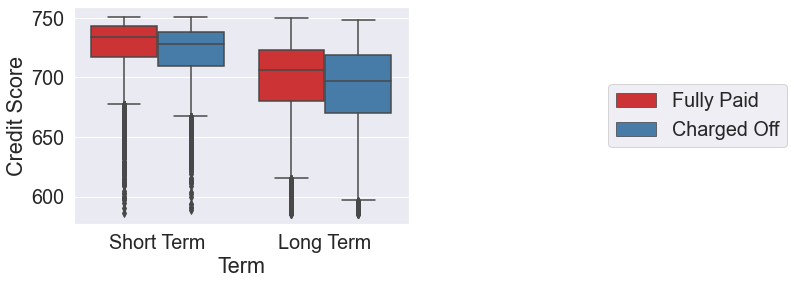

In [111]:
 ax = sns.boxplot(x="Term", y="Credit Score", hue="Loan Status",
               data=df, palette="Set1")
ax.legend(loc=6,borderaxespad=27)

In [112]:
df.groupby(['Loan Status',"Term"]).agg({'Credit Score':np.mean})

Credit Score
Loan Status Term                    
Charged Off Long Term         691.39
            Short Term        721.69
Fully Paid  Long Term         699.23
            Short Term        728.04

#### Home Ownership

In [113]:
#I want to replace 'HaveMortgage' with 'Home Mortgage'.

In [114]:
df['Home Ownership']=df['Home Ownership'].replace('HaveMortgage', 'Home Mortgage')

In [115]:
HL=df.groupby(['Home Ownership','Loan Status']).agg({'Loan Status':np.size})
HL

Loan Status
Home Ownership Loan Status             
Home Mortgage  Charged Off         9941
               Fully Paid         33790
Own Home       Charged Off         2102
               Fully Paid          6097
Rent           Charged Off        10596
               Fully Paid         27259

In [116]:
contigency_table= pd.crosstab(df['Home Ownership'],df['Loan Status'])
contigency_table

Loan Status,Charged Off,Fully Paid
Home Ownership,,
Home Mortgage,9941,33790
Own Home,2102,6097
Rent,10596,27259


In [117]:
contigency_table.iloc[1,0]

2102

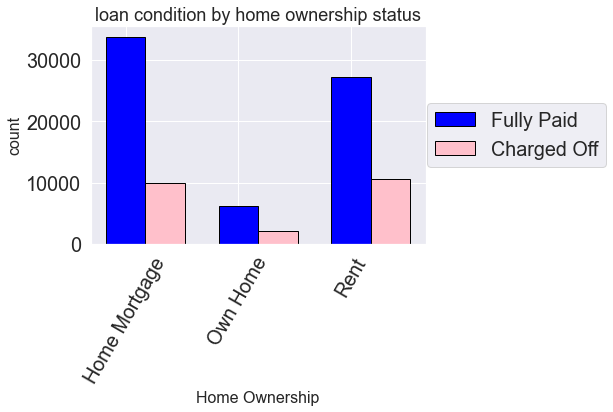

In [118]:
home_ownership=[ 'Home Mortgage','Own Home','Rent']
loan_condition=['Fully Paid','Charged Off']
pos = np.arange(len(home_ownership))
bar_width = 0.35
Index_good=[contigency_table.iloc[0,1],contigency_table.iloc[1,1],contigency_table.iloc[2,1]]
Index_bad=[contigency_table.iloc[0,0],contigency_table.iloc[1,0],contigency_table.iloc[2,0]]
 
plt.bar(pos,Index_good,bar_width,color='blue',edgecolor='black')
plt.bar(pos+bar_width,Index_bad,bar_width,color='pink',edgecolor='black')
plt.xticks(pos, home_ownership)
plt.xlabel('Home Ownership', fontsize=16)
plt.ylabel('count', fontsize=16)
plt.title('loan condition by home ownership status',fontsize=18)
plt.legend(loan_condition,loc=6,borderaxespad=17)
plt.xticks(rotation=60)
plt.show()

In [119]:
# Chi-square test of independence

In [120]:
chi_2, p_val, dof, exp_val = chi2_contingency(contigency_table)

print('Chi-square is %f'%chi_2, '\n\np_value is %f'%p_val, '\n\ndegree of freedom is %i'%dof)

if p_val < 0.05:
    print("\nThere is some correlation between the two variables at significance level 0.05")
else:
    print("\nThere is no correlation between the two variables")

Chi-square is 298.439150 

p_value is 0.000000 

degree of freedom is 2

There is some correlation between the two variables at significance level 0.05


In [121]:
df.groupby(['Home Ownership']).agg({'Current Loan Amount':np.mean})

,Current Loan Amount
Home Ownership,
Home Mortgage,346496.29
Own Home,296613.03
Rent,270751.24


# """ Data Cleansing"""

In [122]:
df_orginal=df

In [123]:
### I split my train dataset and keep 10% of train to evaluate my selected model at the end of this project

In [124]:
test=df[(df['source']=='test')]
train=df[(df['source']=='train')]
test.shape,train.shape

((10353, 18), (89786, 18))

In [125]:
#splitting test and training sets
from sklearn.model_selection import train_test_split
train, dftest = train_test_split(train, test_size=0.1, random_state=0)
train.shape , dftest.shape

((80807, 18), (8979, 18))

In [126]:
dftest['source']='test'
train= pd.concat([train,dftest],ignore_index=True, sort=True)
df= pd.concat([train,test],ignore_index=True, sort=True)
train.shape,test.shape,df.shape

((89786, 18), (10353, 18), (100139, 18))

# 1) Handling Duplicate Data



In [127]:
#I did that at the begining for train data set

# 2) Handling Outliers

### Method 1: Mean and Standard Deviation Method

### I will drop outliers detected by this method for numeric columns if just happened in train data set. If there is outliers in test data set I keep outliers in train data set as well for modeling

In [128]:
test=df[(df['source']=='test')]
train=df[(df['source']=='train')]

In [129]:
#numeric variables
df_num=df.select_dtypes(exclude='object')# Just get me the numeric variables
df_num.columns

Index(['Annual Income', 'Bankruptcies', 'Credit Score',
       'Current Credit Balance', 'Current Loan Amount', 'Maximum Open Credit',
       'Monthly Debt', 'Months since last delinquent',
       'Number of Credit Problems', 'Number of Open Accounts', 'Tax Liens',
       'Years of Credit History'],
      dtype='object')

In [130]:
def outlier_detection(dftemp,var):
    sns.boxplot(x=df[var])
    mean1=df[var].mean()
    std1=df[var].std()
    Max1=mean1+3*std1
    Min1=mean1-3*std1
    print(Min1,Max1)
    if ((max(dftemp[var]) <Max1)& (min(dftemp[var])>Min1)):
        print("\nThere is no outlier in '%s' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function" % var)   
    else: print("\nThere are some outliers in '%s' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function" % var)   
    return dftemp[var].describe()

-1874204.7061441038 4624609.228203862

There are some outliers in 'Annual Income' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count      63568.00
mean     1372042.48
std       911664.75
min        76627.00
25%       847770.50
50%      1168519.00
75%      1647043.50
max     36475440.00
Name: Annual Income, dtype: float64

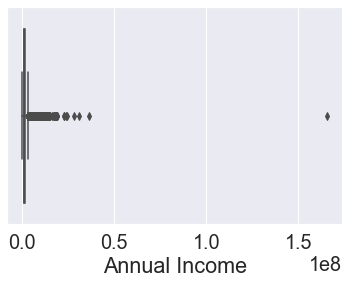

In [131]:
outlier_detection(train,'Annual Income')

-1874204.7061441038 4624609.228203862

There are some outliers in 'Annual Income' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count       15082.00
mean      1388520.18
std       1617033.14
min         81092.00
25%        848958.00
50%       1170865.50
75%       1668428.00
max     165557393.00
Name: Annual Income, dtype: float64

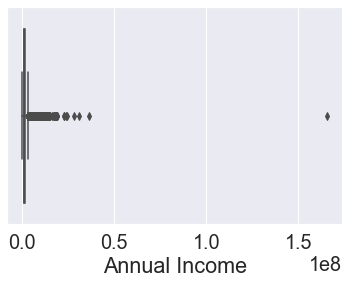

In [132]:
outlier_detection(test,'Annual Income')

-0.9287536970271 1.1599810377720812

There are some outliers in 'Bankruptcies' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count   80636.00
mean        0.12
std         0.35
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         7.00
Name: Bankruptcies, dtype: float64

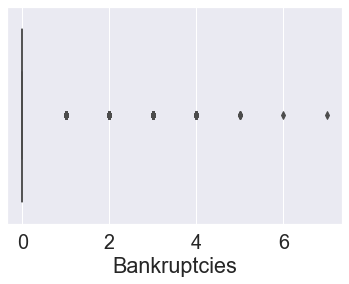

In [133]:
outlier_detection(train,'Bankruptcies')

-0.9287536970271 1.1599810377720812

There are some outliers in 'Bankruptcies' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count   18937.00
mean        0.12
std         0.35
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         5.00
Name: Bankruptcies, dtype: float64

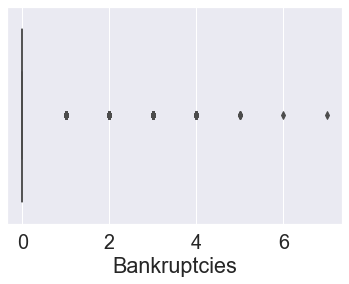

In [134]:
outlier_detection(test,'Bankruptcies')

633.9494562930446 802.8122220286338

There are some outliers in 'Credit Score' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count   63568.00
mean      718.56
std        28.13
min       585.00
25%       706.00
50%       725.00
75%       740.00
max       751.00
Name: Credit Score, dtype: float64

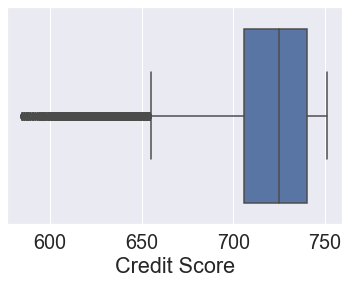

In [135]:
outlier_detection(train,'Credit Score')

633.9494562930446 802.8122220286338

There are some outliers in 'Credit Score' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count   15082.00
mean      717.61
std        28.20
min       585.00
25%       705.00
50%       724.00
75%       739.00
max       751.00
Name: Credit Score, dtype: float64

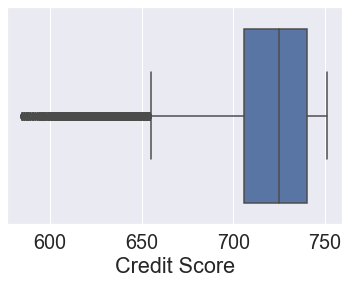

In [136]:
outlier_detection(test,'Credit Score')

In [137]:
# continue with other columns ...

### Method 2 :LoF

## 3)Handling Missing Values

In [138]:
percentage_of_miss()

,Number of Missing,Percentage
Months since last delinquent,53997,0.54
Annual Income,21489,0.21
Credit Score,21489,0.21
Current Loan Amount,12971,0.13
Loan Status,10354,0.10
Years in current job,4583,0.05
Bankruptcies,566,0.01
Tax Liens,364,0.00
Maximum Open Credit,356,0.00
Home Ownership,354,0.00


In [139]:
df_orginal2=df
#df=df_orginal2

In [140]:
#The last 345 observation of test are NaN and there is no evaluation for test dataset here,let me first drop them by this code:
df=df.dropna(thresh=2)

In [141]:
percentage_of_miss()

,Number of Missing,Percentage
Months since last delinquent,53643,0.54
Credit Score,21135,0.21
Annual Income,21135,0.21
Current Loan Amount,12617,0.13
Loan Status,10000,0.10
Years in current job,4229,0.04
Bankruptcies,212,0.00
Tax Liens,10,0.00
Maximum Open Credit,2,0.00


In [142]:
#droping observation(raws) which does not have more than 15 non_missing values
#df.dropna(axis=0,thresh=15,inplace=True)#I am not using this method because I mixed train and test data set
df= df.drop(df[(df['Tax Liens'].isnull())& (df['source']=='train')].index)
df= df.drop(df[(df['Maximum Open Credit'].isnull())& (df['source']=='train')].index) 

In [143]:
 df.drop(df[(df['Loan Status'].isnull())& (df['source']=='train')].index)

,Annual Income,Bankruptcies,Credit Score,Current Credit Balance,Current Loan Amount,Home Ownership,Loan Status,Maximum Open Credit,Monthly Debt,Months since last delinquent,Number of Credit Problems,Number of Open Accounts,Purpose,Tax Liens,Term,Years in current job,Years of Credit History,source
0,744496.00,0.00,737.00,87419.00,215512.00,Rent,Fully Paid,733524.00,6390.27,30.00,0.00,16.00,Other,0.00,Long Term,1 year,22.20,train
1,846716.00,0.00,730.00,120156.00,228756.00,Rent,Charged Off,348700.00,11359.91,nan,0.00,14.00,Buy a Car,0.00,Short Term,6 years,9.20,train
2,954560.00,0.00,708.00,397290.00,493504.00,Rent,Charged Off,508288.00,10579.77,nan,0.00,3.00,Debt Consolidation,0.00,Long Term,10+ years,23.70,train
3,644575.00,0.00,746.00,239875.00,nan,Rent,Fully Paid,617232.00,5962.39,25.00,0.00,10.00,Debt Consolidation,0.00,Short Term,10+ years,25.20,train
4,1408242.00,0.00,668.00,147573.00,308484.00,Rent,Fully Paid,473352.00,21358.47,79.00,0.00,11.00,Debt Consolidation,0.00,Long Term,10+ years,12.30,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99781,1514376.00,0.00,731.00,87058.00,157806.00,Rent,NaN,234410.00,4795.41,nan,0.00,9.00,Debt Consolidation,0.00,Short Term,6 years,12.50,test
99782,763192.00,0.00,718.00,74309.00,132550.00,Home Mortgage,NaN,329692.00,12401.87,20.00,0.00,8.00,Debt Consolidation,0.00,Short Term,4 years,9.90,test
99783,nan,1.00,nan,99636.00,223212.00,Rent,NaN,568370.00,4354.42,nan,1.00,8.00,Debt Consolidation,0.00,Long Term,NaN,27.20,test
99784,972097.00,0.00,721.00,184984.00,nan,Home Mortgage,NaN,240658.00,12232.20,24.00,1.00,8.00,Debt Consolidation,0.00,Short Term,10+ years,16.80,test


In [144]:
percentage_of_miss()

,Number of Missing,Percentage
Months since last delinquent,53642,0.54
Credit Score,21131,0.21
Annual Income,21131,0.21
Current Loan Amount,12616,0.13
Loan Status,10000,0.10
Years in current job,4229,0.04
Bankruptcies,204,0.00
Tax Liens,2,0.00


In [145]:
df['Tax Liens'].fillna(df['Tax Liens'].mode()[0], inplace=True)

In [146]:
percentage_of_miss()

,Number of Missing,Percentage
Months since last delinquent,53642,0.54
Credit Score,21131,0.21
Annual Income,21131,0.21
Current Loan Amount,12616,0.13
Loan Status,10000,0.10
Years in current job,4229,0.04
Bankruptcies,204,0.00


## Feature Engineering(contd.)

#### 2)Encoding

In [147]:
df_orginal3=df

In [148]:
df.to_csv('df_Loan_status_before_Encoding.csv') 

In [149]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99775 entries, 0 to 99785
Data columns (total 18 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Annual Income                 78644 non-null  float64
 1   Bankruptcies                  99571 non-null  float64
 2   Credit Score                  78644 non-null  float64
 3   Current Credit Balance        99775 non-null  float64
 4   Current Loan Amount           87159 non-null  float64
 5   Home Ownership                99775 non-null  object 
 6   Loan Status                   89775 non-null  object 
 7   Maximum Open Credit           99775 non-null  float64
 8   Monthly Debt                  99775 non-null  float64
 9   Months since last delinquent  46133 non-null  float64
 10  Number of Credit Problems     99775 non-null  float64
 11  Number of Open Accounts       99775 non-null  float64
 12  Purpose                       99775 non-null  object 
 13  T

#### 2-1)Mapping

In [150]:
df['Loan Status'].value_counts()

Fully Paid     67138
Charged Off    22637
Name: Loan Status, dtype: int64

In [151]:
df['Loan Status']=df['Loan Status'].map({'Charged Off':1,'Fully Paid':0})

In [152]:
df['Term'].value_counts()

Short Term    73308
Long Term     26467
Name: Term, dtype: int64

In [153]:
df['Term']=df['Term'].map({'Short Term':1,'Long Term':0})

In [154]:
df['Years in current job'].value_counts()

10+ years    30838
2 years       9169
3 years       8205
< 1 year      8156
5 years       6832
1 year        6479
4 years       6124
6 years       5700
7 years       5542
8 years       4593
9 years       3908
Name: Years in current job, dtype: int64

In [155]:
variable='Years in current job'
df[variable]=df[variable].map({'< 1 year':.5,'1 year':1,'2 years':2,'3 years':3,'4 years':4,'5 years':5,'6 years':6,'7 years':7,'8 years':8,'9 years':9,'10+ years':15})

In [156]:
df['Home Ownership'].value_counts()

Home Mortgage    48611
Rent             42054
Own Home          9110
Name: Home Ownership, dtype: int64

In [157]:
df['Purpose'].value_counts()

Debt Consolidation      78704
Other                    8985
Home Improvements        5830
Business Loan            1529
Buy a Car                1307
Medical Bills            1096
Buy House                 652
Take a Trip               532
major_purchase            382
small_business            286
moving                    149
wedding                   115
Educational Expenses      104
vacation                   95
renewable_energy            9
Name: Purpose, dtype: int64

In [158]:
df_orginal4=df

## 2-2) One hot encoding

In [159]:
df= pd.get_dummies(df, drop_first=True)

In [160]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99775 entries, 0 to 99785
Data columns (total 32 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Annual Income                 78644 non-null  float64
 1   Bankruptcies                  99571 non-null  float64
 2   Credit Score                  78644 non-null  float64
 3   Current Credit Balance        99775 non-null  float64
 4   Current Loan Amount           87159 non-null  float64
 5   Loan Status                   89775 non-null  float64
 6   Maximum Open Credit           99775 non-null  float64
 7   Monthly Debt                  99775 non-null  float64
 8   Months since last delinquent  46133 non-null  float64
 9   Number of Credit Problems     99775 non-null  float64
 10  Number of Open Accounts       99775 non-null  float64
 11  Tax Liens                     99775 non-null  float64
 12  Term                          99775 non-null  int64  
 13  Y

### Outliers(contd.)

### Method 2 for handeling Outlier:LoF

In [161]:
df_orginal5=df

In [162]:
df.to_csv('Loan_status1.csv') 

In [163]:
#separating train and test data sets
test2 =df[df['source_train']==0] #test2 =data frame contains only test data set
df=df[df['source_train']==1] 

### Separating misssing values from non_missing values

In [164]:
df1=df.dropna()#df =data frame contains only non_missing values

df2 =df[df.isnull().any(axis=1)] #df =data frame contains only non_missing values

In [165]:
df=df1

In [166]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23712 entries, 0 to 80801
Data columns (total 32 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Annual Income                 23712 non-null  float64
 1   Bankruptcies                  23712 non-null  float64
 2   Credit Score                  23712 non-null  float64
 3   Current Credit Balance        23712 non-null  float64
 4   Current Loan Amount           23712 non-null  float64
 5   Loan Status                   23712 non-null  float64
 6   Maximum Open Credit           23712 non-null  float64
 7   Monthly Debt                  23712 non-null  float64
 8   Months since last delinquent  23712 non-null  float64
 9   Number of Credit Problems     23712 non-null  float64
 10  Number of Open Accounts       23712 non-null  float64
 11  Tax Liens                     23712 non-null  float64
 12  Term                          23712 non-null  int64  
 13  Y

In [167]:
#separating target and predictors
X=df.drop('Loan Status',axis=1)
y=df['Loan Status']
X.shape

(23712, 31)

In [168]:
from sklearn.neighbors import LocalOutlierFactor
lof=LocalOutlierFactor(n_neighbors=5)
res=lof.fit_predict(X)
X_not_outlier=X[res !=-1]
y_not_outlier=y[res !=-1]

In [169]:
df_clean=pd.concat([X_not_outlier,y_not_outlier],axis=1)
df_clean.shape

(23628, 32)

In [174]:
df_clean.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Annual Income,23628.00,1444139.35,864079.18,111245.00,928150.00,1252784.00,1729232.75,18316380.00
Bankruptcies,23628.00,0.11,0.36,0.00,0.00,0.00,0.00,7.00
Credit Score,23628.00,714.22,28.86,585.00,701.00,721.00,737.00,751.00
Current Credit Balance,23628.00,260094.22,292935.41,0.00,101764.00,187387.50,327137.25,7039158.00
Current Loan Amount,23628.00,312812.00,184096.10,21450.00,173910.00,268576.00,431860.00,789250.00
Maximum Open Credit,23628.00,608894.40,1708906.22,0.00,248704.50,422785.00,708268.00,118275542.00
Monthly Debt,23628.00,19202.68,11908.65,0.00,11167.34,17093.25,24676.20,229057.92
Months since last delinquent,23628.00,34.78,21.93,0.00,16.00,31.00,51.00,176.00
Number of Credit Problems,23628.00,0.18,0.53,0.00,0.00,0.00,0.00,15.00
Number of Open Accounts,23628.00,11.51,4.96,2.00,8.00,11.00,14.00,48.00


In [175]:
df=df_clean

In [176]:
df=pd.concat([df,df2],axis=0)

In [177]:
#merge test and train data sets
train=df
test=test2
train['source']='train'
test['source']='test'
df = pd.concat([train,test],ignore_index=True, sort=True)
train.shape , test.shape,df.shape

((80712, 33), (18979, 33), (99691, 33))

## Handling Missing Values(contd.)

In [178]:
percentage_of_miss()

,Number of Missing,Percentage
Months since last delinquent,53642,0.54
Credit Score,21131,0.21
Annual Income,21131,0.21
Current Loan Amount,12616,0.13
Loan Status,10000,0.10
Years in current job,4229,0.04
Bankruptcies,204,0.00


In [179]:
# Correlations between Columns and Bankruptcies

# Find all correlations between Columns and Credit Score and sort 
cor = df.corr()['Bankruptcies'].sort_values(ascending=False)

# Print the correlations
print(cor)

Bankruptcies                    1.00
Number of Credit Problems       0.75
Months since last delinquent    0.12
Years of Credit History         0.07
Tax Liens                       0.05
Years in current job            0.04
Purpose_Home Improvements       0.03
Term                            0.03
Purpose_Take a Trip             0.01
Home Ownership_Own Home         0.00
Home Ownership_Rent             0.00
Purpose_Medical Bills           0.00
Purpose_Buy House               0.00
Purpose_Debt Consolidation      0.00
source_train                    0.00
Purpose_small_business         -0.00
Purpose_vacation               -0.00
Purpose_renewable_energy       -0.00
Loan Status                    -0.00
Purpose_moving                 -0.00
Purpose_major_purchase         -0.00
Purpose_wedding                -0.01
Purpose_Buy a Car              -0.01
Purpose_Educational Expenses   -0.01
Maximum Open Credit            -0.02
Purpose_Other                  -0.02
Number of Open Accounts        -0.02
C

In [180]:
df['Bankruptcies'] = df.groupby('Number of Credit Problems')['Bankruptcies'].transform(lambda x: x.fillna(x.mode()[0]))